### SURUTHI S

225229141
PML DIFFERENT DATA FORMATS

# 1. Tabular, Spreadsheet and Interchange Data Formats

In [1]:
import pandas as pd
import pickle

In [2]:
#creating a file with .dat extension
f = open("C:\\Users\\SURUTHI S\\Desktop\\binaryfile.dat","wb")
data = 'This is a sample file with .dat as extension.\nDAT file contains important information for software to handle. \nThe information contained inside a DAT file is usually either plain text or binary.'
pickle.dump(data,f)
f.close()


In [3]:
# Reading the file with .dat extension

f = open("C:\\Users\\SURUTHI S\\Desktop\\binaryfile.dat","rb")
content = pickle.load(f)
print(content)
f.close()

This is a sample file with .dat as extension.
DAT file contains important information for software to handle. 
The information contained inside a DAT file is usually either plain text or binary.


### "CSV" — comma-separated values (.csv)

In [4]:
import pandas as pd
path = "C:\\Users\\SURUTHI S\\Desktop\\exchange_rates_1.csv"
df = pd.read_csv(path)
df

,Country,rate
0,AED,3.841908
1,AFN,91.521427
2,ALL,115.869913
3,AMD,413.784367
4,ANG,1.885329
...,...,...
164,YER,261.738479
165,ZAR,18.141709
166,ZMK,9415.187845
167,ZMW,18.071091


In [5]:
df.size

338

In [6]:
df.shape

(169, 2)

In [ ]:
df = pd.read_csv(path,skiprows = 1)
df = pd.read_csv(path,skiprows = 1,header = None,names = ['ContryNames',"ExchangeRates"])
df = pd.read_csv(path,nrows = 3)
df = pd.read_csv(path,na_values = ['not given','na','not available'])

df = pd.read_csv(path,na_values = {'Country':['-1','na'],'rate':['na']})
df = pd.read_csv(path,index_col = 0)

#### "XLSX" — Excel 2007 format (.xlsx) 

In [7]:
path ="C:\\Users\\SURUTHI S\\Desktop\\exchange_rates xl.xlsx"
xlsx = pd.read_excel(path)
xlsx

# xlsx = pd.read_excel(path,sheet_name = 0)
# xlsx = pd.read_excel(path,sheet_name = "exchange_rates_1")
# xlsx = pd.read_excel(path,"exchange_rates_1")
# xlsx = pd.read_excel(path,index_col = 0)

,Country,rate
0,AED,3.841908
1,AFN,na
2,ALL,not available
3,AMD,7
4,ANG,1.885329
...,...,...
164,YER,261.738479
165,ZAR,18.141709
166,ZMK,9415.187845
167,ZMW,18.071091


In [8]:
# using convertors

def convert_null_rate(cell):
    if cell in ['na',"not available","n.a"]:
        return None
    return cell

xlsx = pd.read_excel(path,converters = {
    'rate' :convert_null_rate
})
xlsx


,Country,rate
0,AED,3.841908
1,AFN,NaN
2,ALL,NaN
3,AMD,7.000000
4,ANG,1.885329
...,...,...
164,YER,261.738479
165,ZAR,18.141709
166,ZMK,9415.187845
167,ZMW,18.071091


In [9]:
# to write dataframe into "excel" file 

xlsx.to_excel("new.xlsx",sheet_name = 'exchange')

# writing to a specific offset

xlsx.to_excel("new.xlsx",sheet_name = 'exchange',startrow=2,startcol = 2)

# removing indexes

xlsx.to_excel("new.xlsx",sheet_name = 'exchange',index = False)

In [10]:
# writing 2 different dataframes into 2 different sheets of an excel file
# using ExcelWriter Class

stocks = pd.DataFrame({
    'tickers' :["Google","Yahoo","Tesla"],
    "price" : [99,90,100],
    "pe" : [91.3,90.3,90],
    "eps": [23,24,21] 
})

exchange = pd.DataFrame({
    'Country': ['India','UK','USA'],
    'Currency': ['INR','GBP','USD']
})


with pd.ExcelWriter('stock_exchange_.xlsx') as writer:
    stocks.to_excel(writer,sheet_name ="stocks",index = False)
    exchange.to_excel(writer,sheet_name = 'exchange currency',index = False)

# "TSV" — tabseparated values (.tsv)

In [11]:
movies = [["The Shawshank Redemption",1994],
    ["The Matrix", 1999],
    ["Breaking Bad", 2008],
    ["The Office" ,2004],
    ["Jumanji" , 2000] 
]

mov = pd.DataFrame(movies)

# writing a tsv file
mov.to_csv("movielist.csv",sep = '\t',index=False)

In [12]:
# reading a tsv file

path = "C:\\Users\\SURUTHI S\\movielist.csv"
data = pd.read_csv(path,sep = '\t',names = ['Movies',"Year"],skiprows=1)
data

,Movies,Year
0,The Shawshank Redemption,1994
1,The Matrix,1999
2,Breaking Bad,2008
3,The Office,2004
4,Jumanji,2000


### “ARFF” - Attribute-Relation File Format (.arff)

In [15]:
from scipy.io import arff
path = "C:\\Users\\SURUTHI S\\Desktop\\demo.arff"
data = arff.loadarff(path)
df = pd.DataFrame(data[0])
df

,a0,a1,CLASS
0,1.000070,40.9378,b'0'
1,0.997360,41.1714,b'0'
2,0.134799,41.8113,b'0'
3,2.475850,41.6346,b'0'
4,-3.058700,41.3887,b'0'
...,...,...,...
2985,98.255900,68.0158,b'9'
2986,96.500700,67.9212,b'9'
2987,96.885200,68.1787,b'9'
2988,96.834000,67.9841,b'9'


In [ ]:
### "XLS" — Excel spreadsheet (.xls)

In [16]:
import xlrd
xls = xlrd.open_workbook("C:\\Users\\SURUTHI S\\Desktop\\exchange_rates_1.xls")
xls


In [17]:
!pip install pandas_ods_reader

  Created wheel for ezodf: filename=ezodf-0.3.2-py2.py3-none-any.whl size=49004 sha256=7e21722b893dea9c4f9192da2cc2ef5d7d426f2d0cd872ed997ac2dfba9688bf
  Stored in directory: c:\users\suruthi s\appdata\local\pip\cache\wheels\d0\0e\c2\1af349f0c9e110ed08133a3d579f402f3ec1c031eac80bc084
Successfully built ezodf


### JSON

In [21]:
import json
x =  '{ "name":"John", "age":30, "city":"New York"}'

# loding x:
y = json.loads(x)
y

{'name': 'John', 'age': 30, 'city': 'New York'}

In [22]:
# dumping 
x = {
  "name": "John",
  "age": 30,
  "city": "New York"
}

y = json.dumps(x)

print(y)

{"name": "John", "age": 30, "city": "New York"}


### html

In [23]:

f = open('demo.html', 'w')

html_template = """<html>
<head>
<title>Title</title>
</head>
<body>
<h2>Welcome To GFG</h2>

<p>Default code has been loaded into the Editor.</p>

</body>
</html>
"""


f.write(html_template)
f.close()


In [24]:

import webbrowser

# open html file
webbrowser.open('GFG.html')


True

# 2. Data File Formats

### pkl

In [26]:
import pandas as pd
data = {
    'Name': ['Microsoft Corporation', 'Google, LLC', 'Tesla, Inc.',\
             'Apple Inc.', 'Netflix, Inc.'],
    'Icon': ['MSFT', 'GOOG', 'TSLA', 'AAPL', 'NFLX'],
    'Field': ['Tech', 'Tech', 'Automotive', 'Tech', 'Entertainment'],
    'Market Shares': [100, 50, 160, 300, 80]
           }
df = pd.DataFrame(data)
print(df)

                    Name  Icon          Field  Market Shares
0  Microsoft Corporation  MSFT           Tech            100
1            Google, LLC  GOOG           Tech             50
2            Tesla, Inc.  TSLA     Automotive            160
3             Apple Inc.  AAPL           Tech            300
4          Netflix, Inc.  NFLX  Entertainment             80


In [27]:
df.to_pickle('company info.pkl')

In [28]:
df2 = pd.read_pickle('company info.pkl')
print(df2)

                    Name  Icon          Field  Market Shares
0  Microsoft Corporation  MSFT           Tech            100
1            Google, LLC  GOOG           Tech             50
2            Tesla, Inc.  TSLA     Automotive            160
3             Apple Inc.  AAPL           Tech            300
4          Netflix, Inc.  NFLX  Entertainment             80


### HDF5

In [32]:
pip install h5py

Note: you may need to restart the kernel to use updated packages.


HDF5 file stands for Hierarchical Data Format 5. It is an open-source file which comes in handy to store large amount of data.

When dealing with large amounts of data, either experimental or simulated, saving it to several text files is not very efficient.

Sometimes you need to access a specific subset of the dataset, and you don't want to load it all to memory.

If you are looking for a solution that integrates nicely with numpy and pandas, then the HDF5 format may be the solution you were seeking.

Each HDF5 file has an internal structure that allows you to search for a specific dataset.

You can think of it as a single file with its hierarchical structure, just like a collection of folders and subfolders. By default, the data is stored in binary format, and the library is compatible with different data types.

One essential option of the HDF5 format is that it allows attaching metadata to every element in the structure, making it ideal for generating self-explanatory files.

In Python, there are two libraries that can interface with the HDF5 format: PyTables and h5py.

The first one is the one employed by Pandas under-the-hood, while the second is the one that maps the features of the HDF5 specification to numpy arrays.

While PyTables can be thought of as implementing database-like features on top of the HDF5 specification, h5py is the natural choice when dealing with N-dimensional numpy arrays

In [33]:
import h5py
import numpy as np

array = np.random.randn(1000)

with h5py.File('sample.hdf5', 'w') as f:
    df = f.create_dataset("default", data=array)

In [34]:
with h5py.File('sample.hdf5', 'r') as f:
    data = f['default']
    print(min(data))
    print(max(data))
    print(data[:35])
    

-3.4327925687801133
3.054276244128395
[-0.47174542 -0.80059159  0.48640005  0.39277869  0.49499301  2.11481462
 -0.31611197 -1.56789032  1.61050371  0.29789719  0.70045488 -1.30504023
  0.47775001 -0.1251837   0.72964197  0.59967763 -0.22508736 -0.17223252
  0.03619734 -0.61048008  0.36524084  0.73912925  0.46934877 -1.04189107
  1.35769652 -0.02735697 -0.44756337  0.80724893 -0.63856807  0.27854232
  0.03102895 -0.38362386  1.65856176  0.01312182  0.50758921]


### zip

In [35]:
import zipfile
path = "C:\\Users\\SURUTHI S\\Desktop\\sample zip.zip"
with zipfile.ZipFile(path,'r') as zipf:
    zipf.printdir()

File Name                                             Modified             Size
sample zip/data.txt                            2022-12-16 19:36:24           11
sample zip/document.txt                        2022-12-16 19:36:02           14
sample zip/estate.jpg                          2022-10-31 19:24:12       459264
sample zip/exchange_rates_1.xls                2022-12-16 17:42:38        35840
sample zip/file.txt                            2022-12-16 14:09:40            0
sample zip/Taylor-Swift-Style-320.mp3          2022-12-16 18:24:24      9293755


In [36]:
# writing in a zip file
with zipfile.ZipFile('writing_zip.zip', 'w') as myzip:
    myzip.write('example1.txt')
    myzip.printdir()


File Name                                             Modified             Size
example1.txt                                   2022-12-06 20:38:43           45


### sql

In [ ]:
import sqlite3
connection = sqlite3.connect("sqltest.sql")
cursor = connection.cursor()
cursor.execute(""" CREATE TABLE sqltest (name text, id integer)""")

cursor.execute("INSERT INTO sqltest VALUES('Harvey specter',110)")

In [ ]:
cursor.execute("SELECT * FROM sqltest")
cursor.fetchall()

In [ ]:
with open('sqltest.sql', 'r') as sql_file:
    connection.executescript(sql_file.read())

conn.close()

### mat

In [40]:
from scipy.io import loadmat

path = "C:\\Users\\SURUTHI S\\Desktop\\mat_file.mat"
data = loadmat(path)
print(data)

{'__header__': b'MATLAB 5.0 MAT-file, Platform: PCWIN64, Created on: Wed Jun 14 17:00:53 2017', '__version__': '1.0', '__globals__': [], 'sn': array([[105, 156],
       [112, 203],
       [120,  44],
       ...,
       [416, 171],
       [417,  73],
       [418, 128]], dtype=uint16)}


In [41]:
# Example: Save a Python data structure to a MAT-file:

from scipy import io
array = np.random.randn(100)
io.savemat('export.mat', {"data": array })

cont = loadmat('export.mat')
print(cont)



{'__header__': b'MATLAB 5.0 MAT-file Platform: nt, Created on: Fri Dec 16 23:40:42 2022', '__version__': '1.0', '__globals__': [], 'data': array([[-0.87932285,  2.09616618,  0.33993848, -0.11403469, -0.19258138,
        -1.19904878, -0.63455052,  1.58688565, -1.91880312,  1.32327372,
        -0.03516814,  1.63164898, -0.23931474, -0.18752633, -0.19830789,
         0.64266565,  0.66462617, -0.3129173 , -0.16880454,  0.86169776,
         1.10880851, -1.0206761 ,  1.39734663, -2.17375067,  0.02854017,
        -2.11225745,  2.13154887, -0.36141458,  0.92257177, -0.41419329,
         0.07211923,  0.00781745, -0.54506235,  0.54456022,  0.7308917 ,
        -1.03517554,  0.08258578,  0.27935646,  2.24819018,  0.70327868,
         1.17028578, -0.33153486, -0.15600078, -1.658319  , -0.80024789,
        -0.451228  , -0.44569695,  0.66018382, -0.91765822,  1.9710738 ,
        -0.16061191, -2.57680281,  0.03947375, -0.67089275, -0.4522095 ,
        -0.50097647,  0.06270958, -0.7127146 , -0.56799436

### npy

In [42]:
import numpy as np
 # writing
data = np.random.normal(0, 1, 100)
np.save('data.npy', data)

# reading
data = np.load('data.npy')
data

array([-1.00737011e+00, -5.44868727e-02,  2.61098449e+00,  9.74910288e-01,
       -2.59777500e-01,  6.69194186e-01,  3.78768930e-01,  8.32704598e-01,
        1.22217095e+00,  1.17696741e+00,  4.69540795e-01, -4.02378756e+00,
       -7.77777553e-01, -8.47702186e-01,  2.37552610e+00, -1.93340820e-02,
       -1.92733395e+00,  7.32010362e-02,  4.68779421e-01,  1.10196577e-01,
        1.54056142e+00, -1.75458687e+00, -1.76926645e-01,  2.74744150e-01,
       -1.94170495e+00, -1.51046696e-03, -1.14607132e+00, -8.43025955e-02,
        9.53053841e-02,  3.67907921e-01,  6.50079498e-01,  3.92984253e-02,
        1.24620178e-01,  3.03942910e-01,  1.44965752e+00, -6.45287599e-02,
       -4.03565234e-02, -1.04106595e+00,  3.04676244e-01,  1.72996699e+00,
       -2.08405880e-01,  2.79393855e-01, -9.64538930e-02,  2.35780622e+00,
       -1.87432845e+00, -8.98076573e-02,  5.49834282e-01,  3.36159826e-01,
       -2.49793696e-01,  7.86343836e-01, -8.68281000e-01, -5.65967451e-01,
        1.41273863e+00,  

### npz

In [43]:
from tempfile import TemporaryFile
outfile = TemporaryFile()
x = np.arange(10)
y = np.sin(x)

# writing
np.savez(outfile, x, y)
outfile.seek(0)

# reading 
npzfile = np.load(outfile)
npzfile.files
    
npzfile['arr_0']

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

# 3. Image Data Formats

###  JPG FILE 

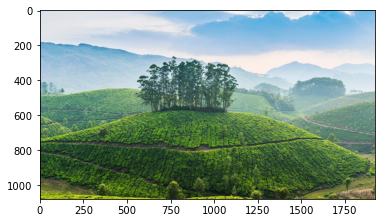

In [44]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

path = "C:\\Users\\SURUTHI S\\Desktop\\estate.jpg"

# Read Images
img = mpimg.imread(path)

# Output Images
plt.imshow(img)


### png

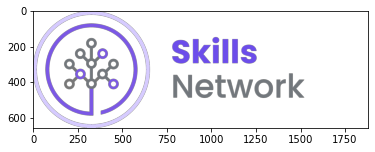

In [50]:
path = "C:\\Users\\SURUTHI S\\image.png"

# Read Images
img = mpimg.imread(path)

# Output Images
plt.imshow(img)


###  TIFF

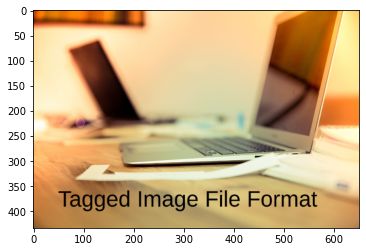

In [51]:
import matplotlib.pyplot as plt
path = "C:\\Users\\SURUTHI S\\Desktop\\file.tiff"
I = plt.imread(path)
plt.imshow(I)

# 4. Video Data Formats

### mp4

In [53]:
# reading

import cv2 
 
path =  "C:\\Users\\SURUTHI S\\Desktop\\video.mp4"
vid_capture = cv2.VideoCapture(path)
 
if (vid_capture.isOpened() == False):
    print("Error opening the video file")

    
else:  
    fps = vid_capture.get(5)
    print('Frames per second : ', fps,'FPS')
    frame_count = vid_capture.get(7)
    print('Frame count : ', frame_count)


while(vid_capture.isOpened()):
    ret, frame = vid_capture.read()
    if ret == True:
        cv2.imshow('Frame',frame)
  

    key = cv2.waitKey(20)
     
    if key == ord('q'):
        break
    else:
        break

vid_capture.release()
cv2.destroyAllWindows()

Frames per second :  30.0 FPS
Frame count :  239.0


In [54]:
# playing

def play_movie(path):
    from os import startfile
    startfile(path)
    
path =  "C:\\Users\\SURUTHI S\\Desktop\\video.mp4"
play_movie(path)

### avi

In [55]:
import numpy as np
import cv2
 
cap = cv2.VideoCapture('vid.avi')
 
while(cap.isOpened()):
    ret, frame = cap.read()
 
 
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    cv2.imshow('frame', gray)
 
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
 
 
cap.release()

# 5. Audio Data Formats

### mp3

In [56]:
from IPython.display import Audio
tune = "C:\\Users\\SURUTHI S\\Desktop\\Taylor-Swift-Style-320.mp3"


In [57]:
Audio(data = tune,autoplay = False)

# 6. Text Data Formats

### txt

In [58]:
with open('example1.txt') as f:
    contents = f.read()
    print(contents)

This is line 1 
This is line 2
This is line 3


### pdf

In [61]:
! pip install PyPDF2

In [62]:
import PyPDF2

path = "C:\\Users\\SURUTHI S\\Desktop\\sample.pdf"
pdfFileObj = open(path, 'rb')

pdfReader = PyPDF2.PdfFileReader(pdfFileObj)

# printing number of pages in pdf file
print(pdfReader.numPages)

# creating a page object
pageObj = pdfReader.getPage(0)

# extracting text from page
print(pageObj.extractText())

# closing the pdf file object
pdfFileObj.close()


1
This is a sam ple pdf  


### DOC

In [63]:
! pip install docx2txt

In [64]:
import docx2txt
path = 'C:\\Users\\SURUTHI S\\Desktop\\sampledoc.docx'
my_text = docx2txt.process(path)
print(my_text)

This is a sample doc file
